# フーリエ平滑化スペクトルの可視化

逆フーリエ変換を **前処理（平滑化）手段** として使う。

1. 波数スペクトルを **逆FFT** してインターフェログラム領域へ移す
2. 中心（センターバースト＝低周波・広いバンド形状）を残し、**外側（高周波＝細かい波＝ノイズ）をマスク（0化）**
3. **FFT** で波数スペクトルへ復元（=ローパスフィルタによる平滑化）

復元後スペクトルを `water_band_moisture_visualization` と同じ流儀で可視化する。

- **train**: 含水率(MC)で連続カラー着色
- **test**: 含水率ラベルが無いため **樹種** で離散着色し、train に重ねる
- 列 = マスク強度（残す中心割合）、行 = 注目バンド

> フーリエ領域でのスペクトル平滑化（インターフェログラム切り詰め＝アポダイゼーション的ローパス）。
> 細かい波（高波数側の高周波成分）はインターフェログラムの裾に対応するため、裾を0にすると平滑化される。

In [22]:
import os, sys
if not os.path.exists('data/train_clean.csv') and os.path.exists('../data/train_clean.csv'):
    os.chdir('..')
sys.path.insert(0, os.getcwd())

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from nir_features import snv

mpl.rcParams['font.family'] = 'Hiragino Sans'   # 日本語(樹種名)表示用
mpl.rcParams['axes.unicode_minus'] = False
mpl.rcParams['figure.dpi'] = 110

In [23]:
# ---- データ読み込み(Shift-JIS, メタ列 + 波数[cm^-1]降順) ----
META_TR = ['sample number', 'species number', '樹種', '含水率']
META_TE = ['sample number', 'species number', '樹種']

train = pd.read_csv('data/train_clean.csv', encoding='shift-jis')
test  = pd.read_csv('data/test.csv',  encoding='shift-jis')

wn = train.columns[len(META_TR):].astype(float).values   # 波数 cm^-1 (FFTはこの等間隔格子上で行う)
nm = 1e7 / wn                                             # 波長 nm
order = np.argsort(nm)                                    # 描画用: nm 昇順
nm_sorted = nm[order]

Xtr = train.iloc[:, len(META_TR):].values.astype(float)  # 波数順(native)
Xte = test.iloc[:,  len(META_TE):].values.astype(float)
ytr = train['含水率'].values
sp_te = test['樹種'].values

print('train', Xtr.shape, ' test', Xte.shape)
print('波数間隔 平均 %.3f cm^-1' % np.mean(np.abs(np.diff(wn))))
print('含水率 range: %.1f – %.1f %%' % (ytr.min(), ytr.max()))

train (1270, 1555)  test (550, 1555)
波数間隔 平均 3.857 cm^-1
含水率 range: 0.8 – 298.6 %


In [24]:
def fft_denoise(X, keep_frac):
    """各行を逆FFT→中心から keep_frac の点だけ残し外側(高周波=細かい波/ノイズ)を0→FFTで復元(実部)。
    keep_frac=1.0 は無加工(原波形)。小さいほど強い平滑化。"""
    n = X.shape[1]
    ifg = np.fft.fftshift(np.fft.ifft(X, axis=1), axes=1)
    c = n // 2
    r = max(1, int(round(keep_frac * n / 2)))            # 中心±r点を残す
    ifg[:, :c - r] = 0
    ifg[:, c + r + 1:] = 0
    return np.fft.fft(np.fft.ifftshift(ifg, axes=1), axis=1).real

## 設定（ここを編集）

- `KEEP`: `(ラベル, 中心に残す点の割合)`。割合が小さいほど高周波を多く削り強く平滑化する。
- `BANDS`: 拡大して見る波長帯 `(下限nm, 上限nm)`。

In [25]:
# ====== 編集ポイント ======
KEEP = [('原波形', 1.0), ('弱', 0.15), ('中', 0.06), ('強', 0.03)]
BANDS = [
    (1000, 1300),
    (1430, 1470),   # 水 O-H 第1倍音(~1450)
    (1600, 1700),
    (1910, 1950),   # 水 O-H 結合音(~1940)
    (2000, 2100)
]
# =========================

# 各マスク強度で復元 → 描画用に nm 昇順へ並べ替えて保持(生の吸光度。全波長デモ用)
DEN_TR = {lab: fft_denoise(Xtr, f)[:, order] for lab, f in KEEP}
DEN_TE = {lab: fft_denoise(Xte, f)[:, order] for lab, f in KEEP}
# バンド可視化はSNV後で見る(散乱・ベースライン差を補正)
SNV_TR = {lab: snv(Y) for lab, Y in DEN_TR.items()}
SNV_TE = {lab: snv(Y) for lab, Y in DEN_TE.items()}
LABELS = [lab for lab, _ in KEEP]
print('復元済み(+SNV):', LABELS)

復元済み(+SNV): ['原波形', '弱', '中', '強']


## 全波長: 原波形 vs 平滑化 と 除去成分

数サンプルについて、原波形と最強マスク後を重ね、差分（除去された高周波＝ノイズ）を右に示す。

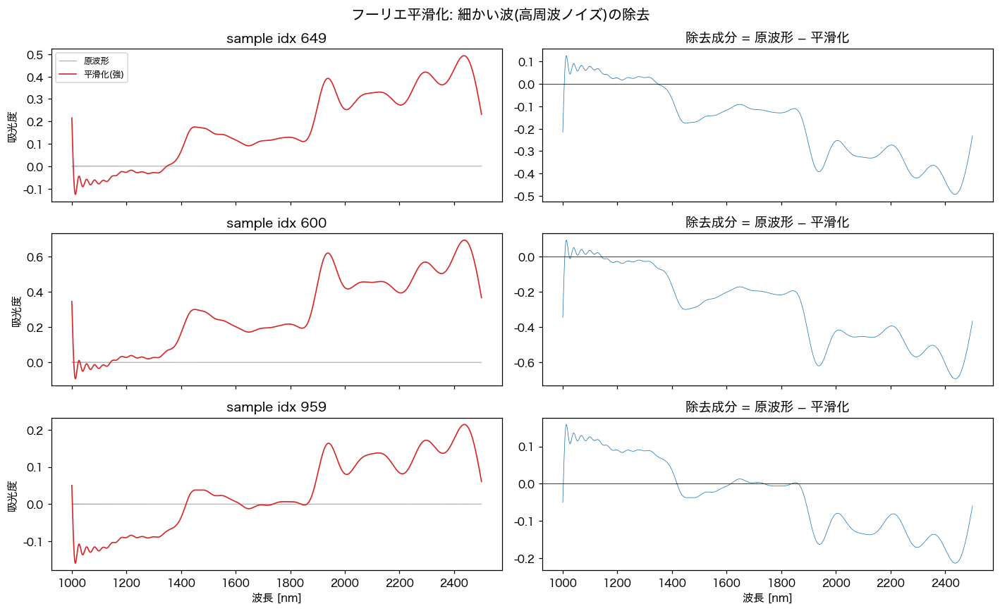

In [26]:
rng = np.random.default_rng(1)
ids = rng.choice(len(Xtr), 3, replace=False)
strong = LABELS[-1]
orig = DEN_TR['原波形']
fig, axes = plt.subplots(3, 2, figsize=(13, 8), sharex=True)
for r, i in enumerate(ids):
    o, d = orig[i], DEN_TR[strong][i]
    axes[r, 0].plot(nm_sorted, o, color='0.6', lw=0.6, label='原波形')
    axes[r, 0].plot(nm_sorted, d, color='C3', lw=1.1, label=f'平滑化({strong})')
    axes[r, 0].set_ylabel('吸光度'); axes[r, 0].set_title(f'sample idx {i}')
    axes[r, 1].plot(nm_sorted, o - d, color='C0', lw=0.5)
    axes[r, 1].axhline(0, color='k', lw=0.5)
    axes[r, 1].set_title('除去成分 = 原波形 − 平滑化')
axes[0, 0].legend(fontsize=8)
for ax in axes[-1]:
    ax.set_xlabel('波長 [nm]')
fig.suptitle('フーリエ平滑化: 細かい波(高周波ノイズ)の除去', fontsize=13)
fig.tight_layout(); plt.show()

## バンド拡大: train(含水率着色) と test(樹種着色) を別出力

行 = バンド、列 = マスク強度。原波形→強と右へ進むほど平滑化される。
**train（含水率で連続着色）と test（樹種で離散着色）は別々の図として出力する。**

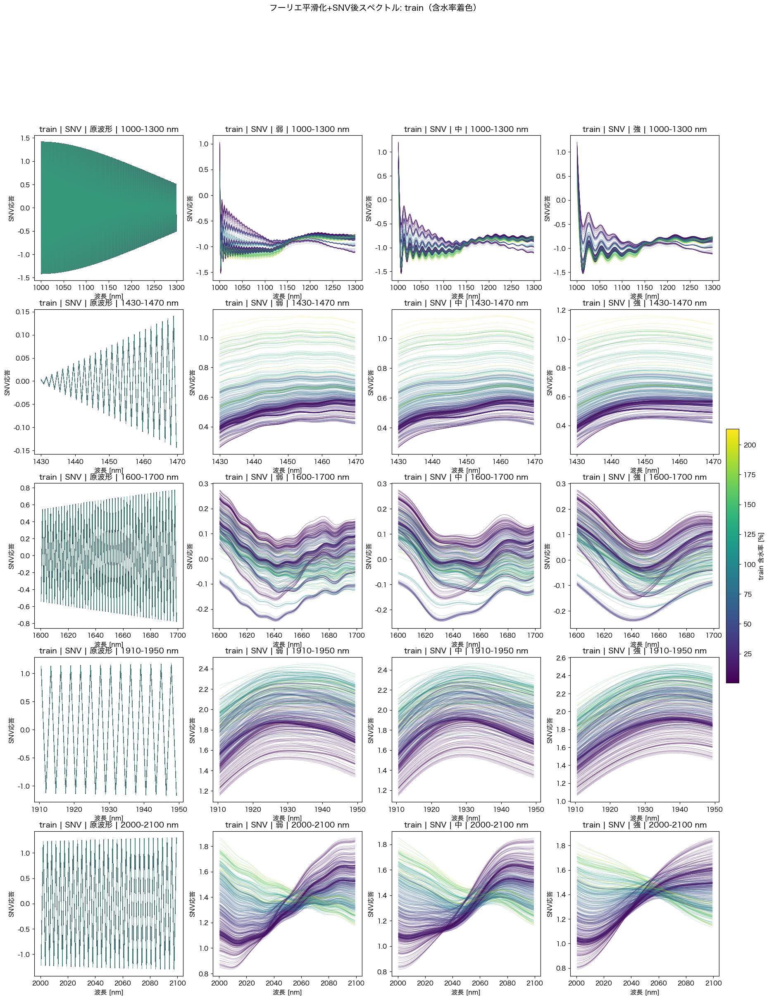

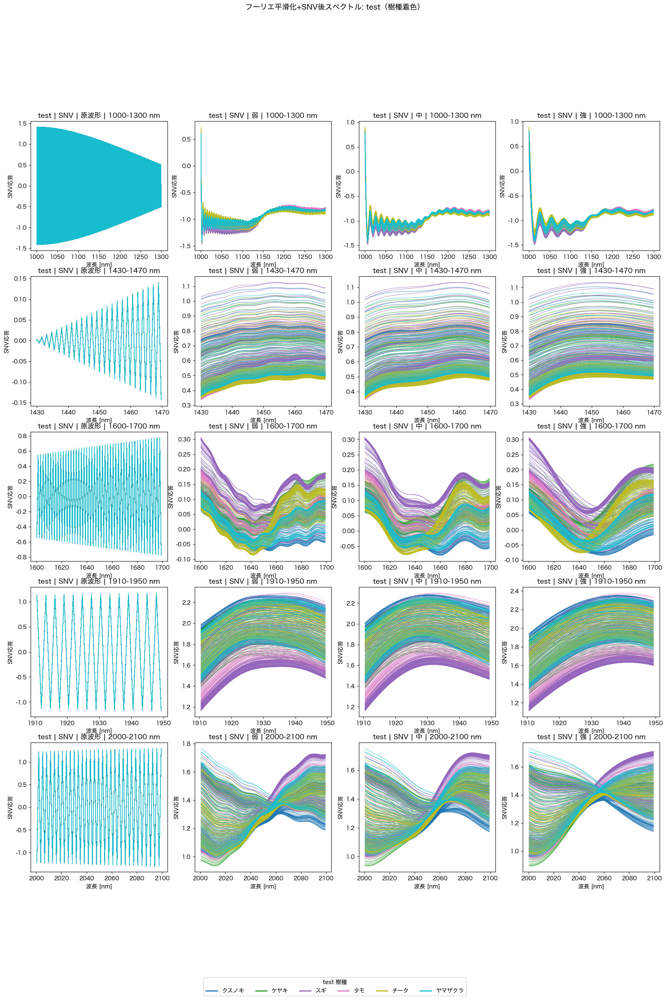

In [27]:
def plot_band_train(ax, Ytr, lo, hi, norm, n=400, rng=None):
    """train: バンドを切り出し含水率で連続着色。"""
    rng = rng or np.random.default_rng(0)
    m = (nm_sorted >= lo) & (nm_sorted <= hi); w = nm_sorted[m]
    for i in rng.choice(len(Ytr), min(n, len(Ytr)), replace=False):
        ax.plot(w, Ytr[i, m], color=plt.cm.viridis(norm(ytr[i])), lw=0.4, alpha=0.45)
    ax.set_xlabel('波長 [nm]'); ax.set_ylabel('SNV応答')

def plot_band_test(ax, Yte, lo, hi):
    """test: バンドを切り出し樹種で離散着色。色辞書を返す。"""
    m = (nm_sorted >= lo) & (nm_sorted <= hi); w = nm_sorted[m]
    species = sorted(pd.unique(sp_te))
    cmap_te = dict(zip(species, plt.cm.tab10(np.linspace(0, 1, len(species)))))
    for s in species:
        for j in np.where(sp_te == s)[0]:
            ax.plot(w, Yte[j, m], color=cmap_te[s], lw=0.7, alpha=0.8)
    ax.set_xlabel('波長 [nm]'); ax.set_ylabel('SNV応答')
    return cmap_te

norm = mpl.colors.Normalize(vmin=ytr.min(), vmax=np.percentile(ytr, 99))
sm = plt.cm.ScalarMappable(norm=norm, cmap=plt.cm.viridis); sm.set_array([])

# --- train（含水率着色） ---
fig, axes = plt.subplots(len(BANDS), len(LABELS), squeeze=False,
                         figsize=(5.0 * len(LABELS), 4.8 * len(BANDS)))
for r, (lo, hi) in enumerate(BANDS):
    for c, lab in enumerate(LABELS):
        plot_band_train(axes[r, c], SNV_TR[lab], lo, hi, norm)
        axes[r, c].set_title(f'train | SNV | {lab} | {lo}-{hi} nm')
cb = fig.colorbar(sm, ax=axes, fraction=0.018, pad=0.01); cb.set_label('train 含水率 [%]')
fig.suptitle('フーリエ平滑化+SNV後スペクトル: train（含水率着色）', y=1.0, fontsize=13)
plt.show()

# --- test（樹種着色） ---
fig, axes = plt.subplots(len(BANDS), len(LABELS), squeeze=False,
                         figsize=(5.0 * len(LABELS), 4.8 * len(BANDS)))
for r, (lo, hi) in enumerate(BANDS):
    for c, lab in enumerate(LABELS):
        cmap_te = plot_band_test(axes[r, c], SNV_TE[lab], lo, hi)
        axes[r, c].set_title(f'test | SNV | {lab} | {lo}-{hi} nm')
handles = [Line2D([0], [0], color=cmap_te[s], lw=2, label=s) for s in cmap_te]
fig.legend(handles=handles, title='test 樹種', loc='lower center',
           ncol=len(handles), bbox_to_anchor=(0.5, -0.02))
fig.suptitle('フーリエ平滑化+SNV後スペクトル: test（樹種着色）', y=1.0, fontsize=13)
plt.show()

## train のみ（含水率着色）

test を外し、平滑化が含水率と吸収の関係をどう見やすくするかを確認する。

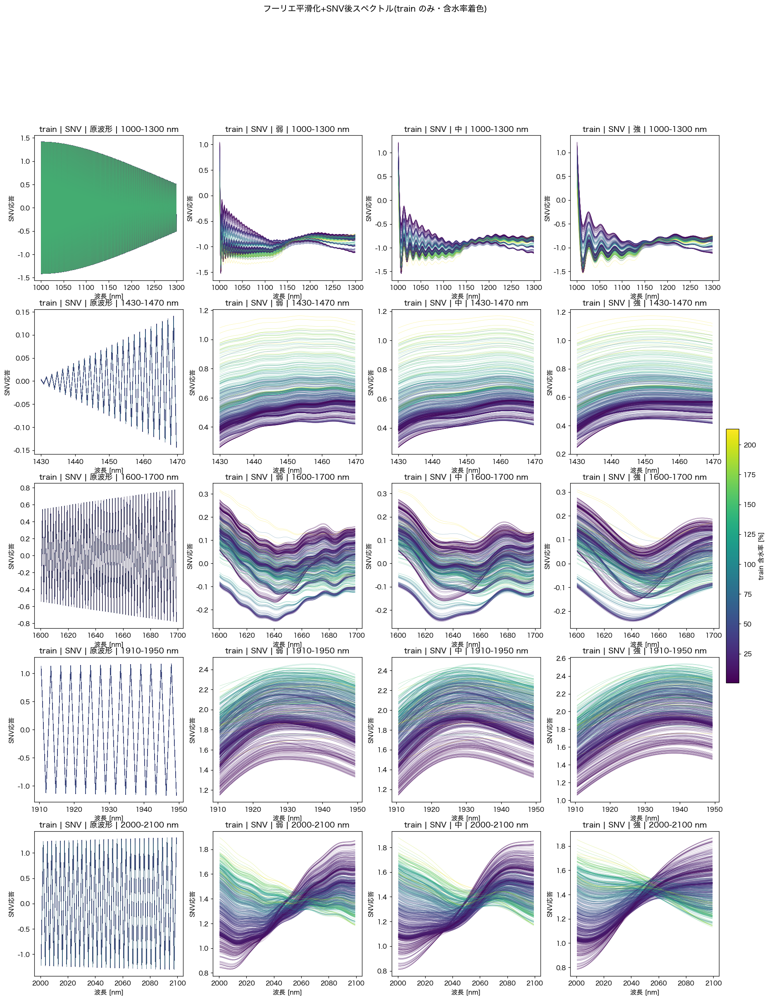

In [28]:
fig, axes = plt.subplots(len(BANDS), len(LABELS), squeeze=False,
                         figsize=(5.0 * len(LABELS), 4.8 * len(BANDS)))
rng = np.random.default_rng(0)
for r, (lo, hi) in enumerate(BANDS):
    m = (nm_sorted >= lo) & (nm_sorted <= hi); w = nm_sorted[m]
    idx = rng.choice(len(Xtr), min(600, len(Xtr)), replace=False)
    for c, lab in enumerate(LABELS):
        ax = axes[r, c]
        for i in idx:
            ax.plot(w, SNV_TR[lab][i, m], color=plt.cm.viridis(norm(ytr[i])), lw=0.4, alpha=0.5)
        ax.set_title(f'train | SNV | {lab} | {lo}-{hi} nm')
        ax.set_xlabel('波長 [nm]'); ax.set_ylabel('SNV応答')
cb = fig.colorbar(sm, ax=axes, fraction=0.018, pad=0.01); cb.set_label('train 含水率 [%]')
fig.suptitle('フーリエ平滑化+SNV後スペクトル(train のみ・含水率着色)', y=1.0, fontsize=13)
plt.show()

## 読み取りのポイント

- **除去成分**（全波長の右列）が構造の無いランダムな細かい波であれば、その平滑化はノイズのみを落とせている。
  バンド形状（広い吸収）に対応する低周波は中心に残るため保持される。
- マスクを **強く** しすぎる（残す割合が小さい）と、実在の細い吸収特徴まで削れて山が鈍る。
  原波形→弱→中→強 の列でバンド頂点が潰れ始める手前が、前処理として安全な強度の目安。
- train の含水率グラデーションがバンド中心で揃い、かつ test 樹種の線がその分布内に収まるなら、
  平滑化が含水率−吸収の関係を保ったままノイズを除けている。

> この `fft_denoise` は SNV/微分などの前段ノイズ除去として `nir_features` パイプラインに組み込み可能（波数等間隔格子上で適用）。

## マスク後スペクトルへの SNV → SG1 / SG2

フーリエ平滑化（`MASK_SG` の強度）後のスペクトルに **SNV → Savitzky–Golay 微分** を適用する。

- **SNV**: 散乱・ベースライン差を補正（行単位、リーク無し）
- **SNV+SG1**: 1次微分（変曲点を強調）
- **SNV+SG2**: 2次微分（重なったピークを分離・強調）

微分はノイズを増幅するため、事前のフーリエ平滑化と相性が良い。行=バンド、列=SNV/SNV+SG1/SNV+SG2。

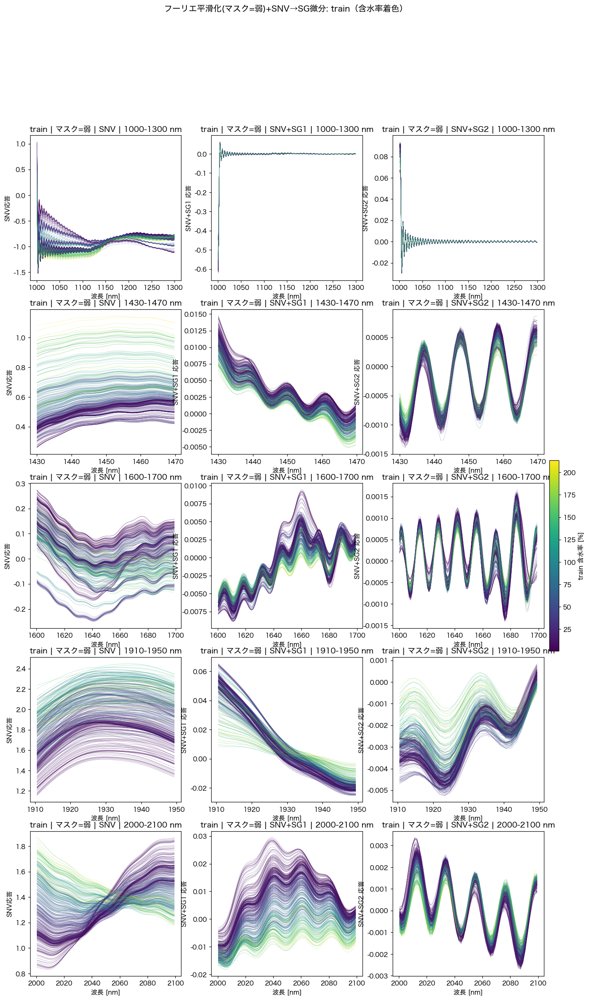

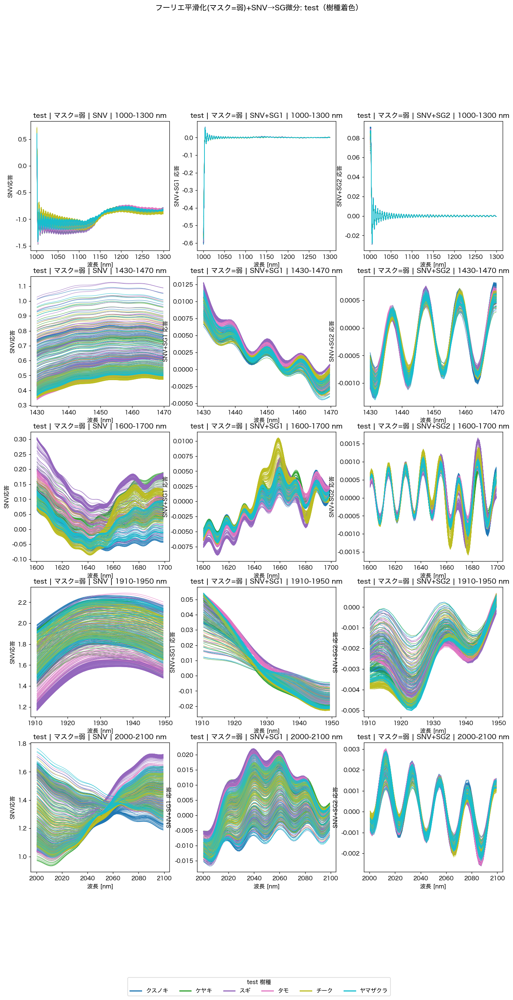

In [36]:
from scipy.signal import savgol_filter

# ====== 編集ポイント: SG をかけるマスク強度 ======
MASK_SG = '弱'          # KEEP のラベルから選ぶ ('原波形'/'弱'/'中'/'強')
SG_WIN, SG_POLY = 11, 2
# ===============================================
assert MASK_SG in LABELS, MASK_SG

def sg(Y, deriv):       # SNV済み配列に SG微分(nm昇順・等間隔近似)
    return Y if deriv == 0 else savgol_filter(Y, SG_WIN, SG_POLY, deriv=deriv, axis=1)

DERIVS = [('SNV', 0), ('SNV+SG1', 1), ('SNV+SG2', 2)]
SG_TR = {lab: sg(SNV_TR[MASK_SG], d) for lab, d in DERIVS}   # SNV後にSG微分
SG_TE = {lab: sg(SNV_TE[MASK_SG], d) for lab, d in DERIVS}

# --- train（含水率着色） ---
fig, axes = plt.subplots(len(BANDS), len(DERIVS), squeeze=False,
                         figsize=(5.0 * len(DERIVS), 4.8 * len(BANDS)))
for r, (lo, hi) in enumerate(BANDS):
    for c, (lab, _) in enumerate(DERIVS):
        plot_band_train(axes[r, c], SG_TR[lab], lo, hi, norm)
        axes[r, c].set_title(f'train | マスク={MASK_SG} | {lab} | {lo}-{hi} nm')
        axes[r, c].set_ylabel('SNV応答' if c == 0 else f'{lab} 応答')
cb = fig.colorbar(sm, ax=axes, fraction=0.018, pad=0.01); cb.set_label('train 含水率 [%]')
fig.suptitle(f'フーリエ平滑化(マスク={MASK_SG})+SNV→SG微分: train（含水率着色）', y=1.0, fontsize=13)
plt.show()

# --- test（樹種着色） ---
fig, axes = plt.subplots(len(BANDS), len(DERIVS), squeeze=False,
                         figsize=(5.0 * len(DERIVS), 4.8 * len(BANDS)))
for r, (lo, hi) in enumerate(BANDS):
    for c, (lab, _) in enumerate(DERIVS):
        cmap_te = plot_band_test(axes[r, c], SG_TE[lab], lo, hi)
        axes[r, c].set_title(f'test | マスク={MASK_SG} | {lab} | {lo}-{hi} nm')
        axes[r, c].set_ylabel('SNV応答' if c == 0 else f'{lab} 応答')
handles = [Line2D([0], [0], color=cmap_te[s], lw=2, label=s) for s in cmap_te]
fig.legend(handles=handles, title='test 樹種', loc='lower center',
           ncol=len(handles), bbox_to_anchor=(0.5, -0.02))
fig.suptitle(f'フーリエ平滑化(マスク={MASK_SG})+SNV→SG微分: test（樹種着色）', y=1.0, fontsize=13)
plt.show()

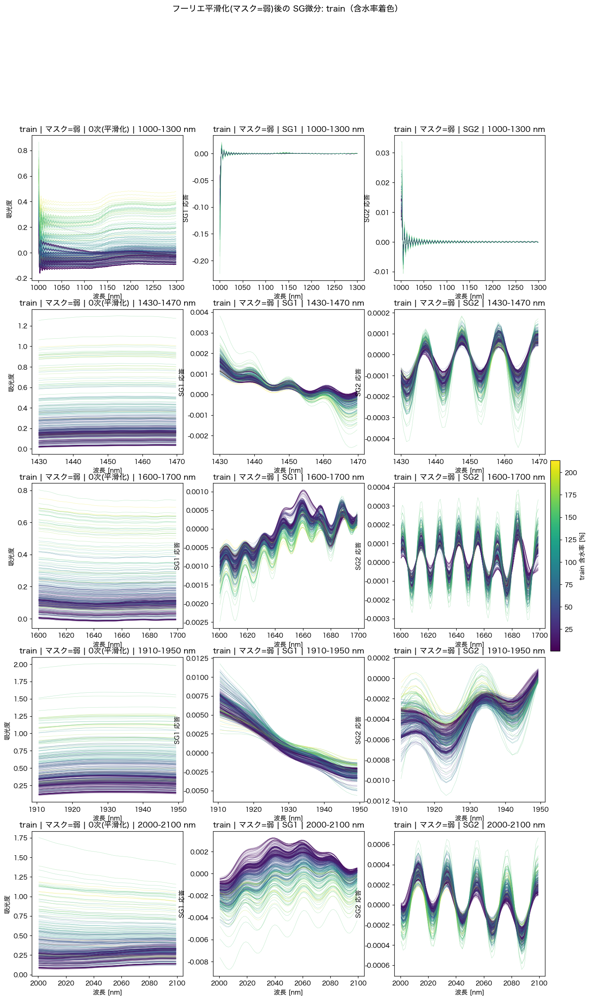

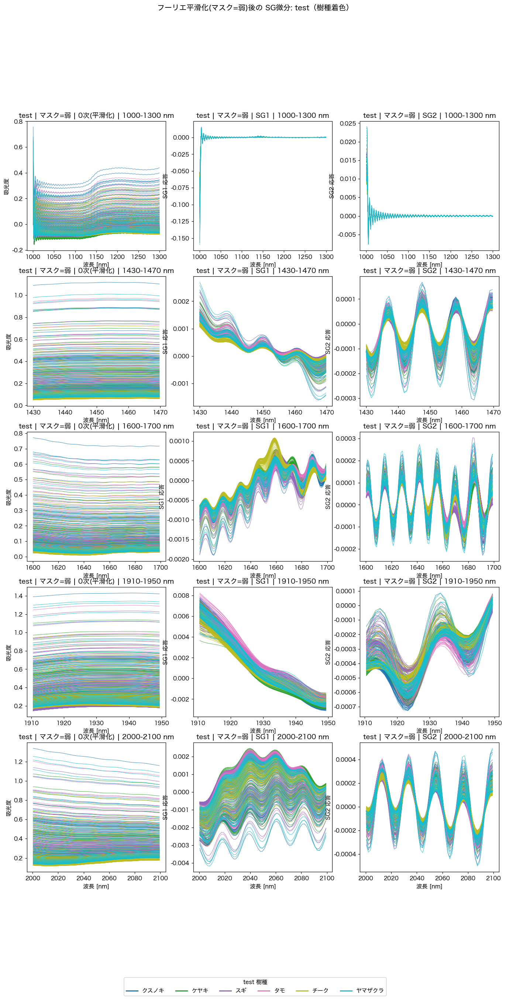

In [30]:
from scipy.signal import savgol_filter

# ====== 編集ポイント: SGをかけるマスク強度 ======
MASK_SG = '弱'          # KEEP のラベルから選ぶ ('原波形'/'弱'/'中'/'強')
SG_WIN, SG_POLY = 11, 2
# ===============================================
assert MASK_SG in LABELS, MASK_SG

def sg(Y, deriv):       # nm昇順・等間隔近似で適用
    return Y if deriv == 0 else savgol_filter(Y, SG_WIN, SG_POLY, deriv=deriv, axis=1)

DERIVS = [('0次(平滑化)', 0), ('SG1', 1), ('SG2', 2)]
SG_TR = {lab: sg(DEN_TR[MASK_SG], d) for lab, d in DERIVS}
SG_TE = {lab: sg(DEN_TE[MASK_SG], d) for lab, d in DERIVS}

# --- train（含水率着色） ---
fig, axes = plt.subplots(len(BANDS), len(DERIVS), squeeze=False,
                         figsize=(5.0 * len(DERIVS), 4.8 * len(BANDS)))
for r, (lo, hi) in enumerate(BANDS):
    for c, (lab, _) in enumerate(DERIVS):
        plot_band_train(axes[r, c], SG_TR[lab], lo, hi, norm)
        axes[r, c].set_title(f'train | マスク={MASK_SG} | {lab} | {lo}-{hi} nm')
        axes[r, c].set_ylabel('吸光度' if c == 0 else f'{lab} 応答')
cb = fig.colorbar(sm, ax=axes, fraction=0.018, pad=0.01); cb.set_label('train 含水率 [%]')
fig.suptitle(f'フーリエ平滑化(マスク={MASK_SG})後の SG微分: train（含水率着色）', y=1.0, fontsize=13)
plt.show()

# --- test（樹種着色） ---
fig, axes = plt.subplots(len(BANDS), len(DERIVS), squeeze=False,
                         figsize=(5.0 * len(DERIVS), 4.8 * len(BANDS)))
for r, (lo, hi) in enumerate(BANDS):
    for c, (lab, _) in enumerate(DERIVS):
        cmap_te = plot_band_test(axes[r, c], SG_TE[lab], lo, hi)
        axes[r, c].set_title(f'test | マスク={MASK_SG} | {lab} | {lo}-{hi} nm')
        axes[r, c].set_ylabel('吸光度' if c == 0 else f'{lab} 応答')
handles = [Line2D([0], [0], color=cmap_te[s], lw=2, label=s) for s in cmap_te]
fig.legend(handles=handles, title='test 樹種', loc='lower center',
           ncol=len(handles), bbox_to_anchor=(0.5, -0.02))
fig.suptitle(f'フーリエ平滑化(マスク={MASK_SG})後の SG微分: test（樹種着色）', y=1.0, fontsize=13)
plt.show()